In [140]:
import sys
import os
import glob
import json
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
%matplotlib inline

In [94]:
df = pd.read_csv('../../01 Data/03 Consolidated/authors_with_gender_v1.csv')

In [116]:
df

,paper_id,date,name,fname,lname,affiliationIds,norm_fname,gender
0,10.1103/PhysRevApplied.9.039901,2018-03-06,Tomoyuki Sasaki,Tomoyuki,Sasaki,[],tomoyuki,NaN
1,10.1103/PhysRevApplied.9.039901,2018-03-06,Yuichiro Ando,Yuichiro,Ando,[],yuichiro,NaN
2,10.1103/PhysRevApplied.9.039901,2018-03-06,Makoto Kameno,Makoto,Kameno,[],makoto,male
3,10.1103/PhysRevApplied.9.039901,2018-03-06,Takayuki Tahara,Takayuki,Tahara,[],takayuki,male
4,10.1103/PhysRevApplied.9.039901,2018-03-06,Hayato Koike,Hayato,Koike,[],hayato,NaN
...,...,...,...,...,...,...,...,...
2503838,10.1103/PhysRevSTAB.14.014001,2011-01-21,Mikhail Zobov,Mikhail,Zobov,a2,mikhail,male
2503839,10.1103/PhysRevSTAB.14.090401,2011-09-15,A. Lorusso,A.,Lorusso,a1,a,NaN
2503840,10.1103/PhysRevSTAB.14.090401,2011-09-15,F. Gontad,F.,Gontad,a1,f,NaN
2503841,10.1103/PhysRevSTAB.14.090401,2011-09-15,A. Perrone,A.,Perrone,a1,a,NaN


##### Make YR, YRMO

In [117]:
# Change format to datetime
df['date'] = df['date'].astype('datetime64[ns]')

# As no time val, extract date, yrmo, yr
df['YearMonth'] = df['date'].map(lambda x: 100*x.year + x.month)
df['year'] = pd.DatetimeIndex(df['date']).year

In [118]:
df

,paper_id,date,name,fname,lname,affiliationIds,norm_fname,gender,YearMonth,year
0,10.1103/PhysRevApplied.9.039901,2018-03-06,Tomoyuki Sasaki,Tomoyuki,Sasaki,[],tomoyuki,NaN,201803,2018
1,10.1103/PhysRevApplied.9.039901,2018-03-06,Yuichiro Ando,Yuichiro,Ando,[],yuichiro,NaN,201803,2018
2,10.1103/PhysRevApplied.9.039901,2018-03-06,Makoto Kameno,Makoto,Kameno,[],makoto,male,201803,2018
3,10.1103/PhysRevApplied.9.039901,2018-03-06,Takayuki Tahara,Takayuki,Tahara,[],takayuki,male,201803,2018
4,10.1103/PhysRevApplied.9.039901,2018-03-06,Hayato Koike,Hayato,Koike,[],hayato,NaN,201803,2018
...,...,...,...,...,...,...,...,...,...,...
2503838,10.1103/PhysRevSTAB.14.014001,2011-01-21,Mikhail Zobov,Mikhail,Zobov,a2,mikhail,male,201101,2011
2503839,10.1103/PhysRevSTAB.14.090401,2011-09-15,A. Lorusso,A.,Lorusso,a1,a,NaN,201109,2011
2503840,10.1103/PhysRevSTAB.14.090401,2011-09-15,F. Gontad,F.,Gontad,a1,f,NaN,201109,2011
2503841,10.1103/PhysRevSTAB.14.090401,2011-09-15,A. Perrone,A.,Perrone,a1,a,NaN,201109,2011


(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125]),
 <a list of 126 Text xticklabel objects>)

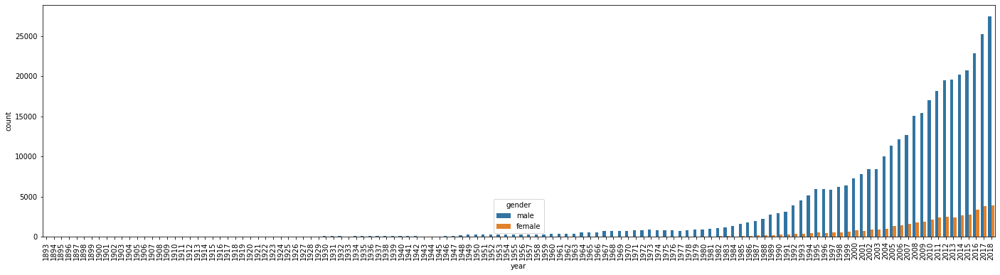

In [388]:
plt.figure(figsize=(24,6))
sns.countplot(df.year, hue=df.gender)
plt.xticks(rotation=90)

## Career Lengths

In [122]:
# Data for only those authors for which we have gender info
df_time = df[(df['gender'] == 'female') | (df['gender'] == 'male')]

In [123]:
df_time

,paper_id,date,name,fname,lname,affiliationIds,norm_fname,gender,YearMonth,year
2,10.1103/PhysRevApplied.9.039901,2018-03-06,Makoto Kameno,Makoto,Kameno,[],makoto,male,201803,2018
3,10.1103/PhysRevApplied.9.039901,2018-03-06,Takayuki Tahara,Takayuki,Tahara,[],takayuki,male,201803,2018
7,10.1103/PhysRevApplied.9.039901,2018-03-06,Masashi Shiraishi,Masashi,Shiraishi,[],masashi,male,201803,2018
8,10.1103/PhysRevApplied.9.029901,2018-02-15,Le Zhang,Le,Zhang,[],le,male,201802,2018
10,10.1103/PhysRevApplied.9.029901,2018-02-15,Dong Wang,Dong,Wang,[],dong,male,201802,2018
...,...,...,...,...,...,...,...,...,...,...
2503834,10.1103/PhysRevSTAB.14.060710,2011-06-24,Gennady Stupakov,Gennady,Stupakov,a2,gennady,male,201106,2011
2503835,10.1103/PhysRevSTAB.14.014001,2011-01-21,Dmitry Shatilov,Dmitry,Shatilov,a1,dmitry,male,201101,2011
2503836,10.1103/PhysRevSTAB.14.014001,2011-01-21,Eugene Levichev,Eugene,Levichev,a1,eugene,male,201101,2011
2503837,10.1103/PhysRevSTAB.14.014001,2011-01-21,Evgeny Simonov,Evgeny,Simonov,a1,evgeny,male,201101,2011


In [323]:
# Group By Data at name-gender level
grouped = df_time.groupby(['name','gender'])
grouped

In [324]:
yr_diff = pd.DataFrame(grouped['year'].agg([np.min, np.max]).reset_index())

In [331]:
yr_diff['year_diff'] = yr_diff['amax'] - yr_diff['amin']
yr_diff.tail(5)

,name,gender,amin,amax,year_diff
88185,Zygmunt Mazur,male,2013,2013,0
88186,Zygmunt Patyk,male,2008,2011,3
88187,Zygmunt Zołnierek,male,1983,1983,0
88188,the ASDEX Upgrade Team,male,1998,1998,0
88189,the ISOLDE Collaboration,male,1999,2002,3


##### Majority of Authors have 1 paper in the data, so their career spans = 0 if we only take the differnce. Hence, add 1 to all lengths, so even for a single occurence the career length is = 1 year

In [332]:
yr_diff['year_diff'] = yr_diff['year_diff'] + 1
yr_diff.tail(5)

,name,gender,amin,amax,year_diff
88185,Zygmunt Mazur,male,2013,2013,1
88186,Zygmunt Patyk,male,2008,2011,4
88187,Zygmunt Zołnierek,male,1983,1983,1
88188,the ASDEX Upgrade Team,male,1998,1998,1
88189,the ISOLDE Collaboration,male,1999,2002,4


In [273]:
# QC
# yr_diff[yr_diff.name=='Alessandro Ferraro']

In [244]:
# Spot Check
# df[df.name=='A.A. Ioannides']
# df[df.name=='Akira Koyama']
# df[df.name=='Alessandro Ferraro']

In [330]:
m = np.mean(yr_diff[yr_diff.gender=='male']['year_diff'])
f = np.mean(yr_diff[yr_diff.gender=='female']['year_diff'])
print('Males: Average publishing Time Periord: {0:0.2f} years'.format(m))
print('Females: Average publishing Time Periord: {0:0.2f} years'.format(f))

diff_prcnt = 100*abs(m-f)/((m+f)/2)
male_ovr_fem = 100*abs(m-f)/f

print('% diff b/w male and females publishing time period: {0:0.1f}%'.format(diff_prcnt))
print('Males display a {0:0.1f}% longer publishing time period over women'.format(male_ovr_fem))

Males: Average publishing Time Periord: 5.48 years
Females: Average publishing Time Periord: 4.18 years
% diff b/w male and females publishing time period: 26.8%
Males display a 31.0% longer publishing time period over women


###### % diff b/w male and females publishing time period: 27%
###### Males display a 31% longer publishing time period over women

In [343]:
print('Total Data: Average Career Length: {0:0.2f} years'.format(np.mean(yr_diff['year_diff'])))

Total Data: Average Career Length: 5.31 years


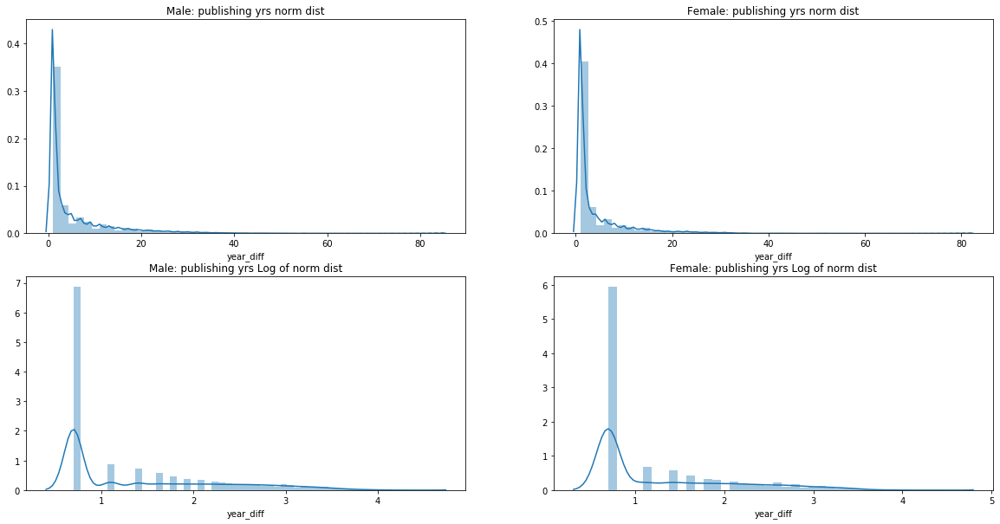

In [334]:
plt.figure(figsize=(20,10))
plt.subplot('221')
plt.title('Male: publishing yrs norm dist')
sns.distplot(yr_diff[yr_diff.gender=='male']['year_diff'])
plt.subplot('222')
plt.title('Female: publishing yrs norm dist')
sns.distplot(yr_diff[yr_diff.gender=='female']['year_diff'])
plt.subplot('223')
plt.title('Male: publishing yrs Log of norm dist')
sns.distplot(yr_diff[yr_diff.gender=='male']['year_diff'].apply(np.log1p))
plt.subplot('224')
plt.title('Female: publishing yrs Log of norm dist')
sns.distplot(yr_diff[yr_diff.gender=='female']['year_diff'].apply(np.log1p))

In [341]:
print('% of Authors with career length = only 1 yr: {0:0.1f}%'.format(100*len(yr_diff[yr_diff['year_diff'] == 1])/len(yr_diff)))

% of Authors with career length = only 1 yr: 52.4%


In [192]:
fig = px.histogram(yr_diff, x="year_diff", color="gender", marginal="box",
                   hover_data=yr_diff.columns)
fig.show()

## Avg Publishing Rate

In [360]:
# Only male and female gender data
df_time.tail(5)

,paper_id,date,name,fname,lname,affiliationIds,norm_fname,gender,YearMonth,year
2503834,10.1103/PhysRevSTAB.14.060710,2011-06-24,Gennady Stupakov,Gennady,Stupakov,a2,gennady,male,201106,2011
2503835,10.1103/PhysRevSTAB.14.014001,2011-01-21,Dmitry Shatilov,Dmitry,Shatilov,a1,dmitry,male,201101,2011
2503836,10.1103/PhysRevSTAB.14.014001,2011-01-21,Eugene Levichev,Eugene,Levichev,a1,eugene,male,201101,2011
2503837,10.1103/PhysRevSTAB.14.014001,2011-01-21,Evgeny Simonov,Evgeny,Simonov,a1,evgeny,male,201101,2011
2503838,10.1103/PhysRevSTAB.14.014001,2011-01-21,Mikhail Zobov,Mikhail,Zobov,a2,mikhail,male,201101,2011


In [392]:
# Spot Check
# ppr_cnt[ppr_cnt.name=='Alessandro Ferraro']

In [393]:
# df[df.name == 'A.A. Aczel']

In [366]:
ppr_count = df_time.groupby(['name','gender']).agg({'year':[np.min, np.max], 'paper_id': 'count'}).reset_index()
ppr_count

name gender  year       paper_id
                                        amin  amax    count
0                    A.A. Aczel   male  2011  2011        2
1                   A.A. Aligia   male  2003  2003        1
2                    A.A. Hasan   male  1999  1999        1
3                A.A. Ioannides   male  1998  1998        2
4                  A.A. Korneev   male  2018  2018        2
...                         ...    ...   ...   ...      ...
88185             Zygmunt Mazur   male  2013  2013        1
88186             Zygmunt Patyk   male  2008  2011        4
88187         Zygmunt Zołnierek   male  1983  1983        2
88188    the ASDEX Upgrade Team   male  1998  1998        1
88189  the ISOLDE Collaboration   male  1999  2002        2

[88190 rows x 5 columns]

###### Design Choice:
Majority of Authors have 1 paper in the data, so their career spans = 0 if we only take the differnce. Hence, add 1 to all lengths, so even for a single occurence the career length is = 1 year

In [367]:
ppr_count['year_diff'] = ppr_count['year']['amax'] - ppr_count['year']['amin'] + 1
ppr_count

name gender  year       paper_id year_diff
                                        amin  amax    count          
0                    A.A. Aczel   male  2011  2011        2         1
1                   A.A. Aligia   male  2003  2003        1         1
2                    A.A. Hasan   male  1999  1999        1         1
3                A.A. Ioannides   male  1998  1998        2         1
4                  A.A. Korneev   male  2018  2018        2         1
...                         ...    ...   ...   ...      ...       ...
88185             Zygmunt Mazur   male  2013  2013        1         1
88186             Zygmunt Patyk   male  2008  2011        4         4
88187         Zygmunt Zołnierek   male  1983  1983        2         1
88188    the ASDEX Upgrade Team   male  1998  1998        1         1
88189  the ISOLDE Collaboration   male  1999  2002        2         4

[88190 rows x 6 columns]

In [368]:
ppr_count['pprs_per_yr'] = ppr_count['paper_id']['count']/ppr_count['year_diff']
ppr_count

name gender  year       paper_id year_diff  \
                                        amin  amax    count             
0                    A.A. Aczel   male  2011  2011        2         1   
1                   A.A. Aligia   male  2003  2003        1         1   
2                    A.A. Hasan   male  1999  1999        1         1   
3                A.A. Ioannides   male  1998  1998        2         1   
4                  A.A. Korneev   male  2018  2018        2         1   
...                         ...    ...   ...   ...      ...       ...   
88185             Zygmunt Mazur   male  2013  2013        1         1   
88186             Zygmunt Patyk   male  2008  2011        4         4   
88187         Zygmunt Zołnierek   male  1983  1983        2         1   
88188    the ASDEX Upgrade Team   male  1998  1998        1         1   
88189  the ISOLDE Collaboration   male  1999  2002        2         4   

      pprs_per_yr  
                   
0             2.0  
1             1.0  
2             1.0  
3             2.0  
4             2.0  
...           ...  
88185         1.0  
88186         1.0  
88187         2.0  
88188         1.0  
88189         0.5  

[88190 rows x 7 columns]

In [436]:
m = np.mean(ppr_count[ppr_count.gender=='male']['pprs_per_yr'])
f = np.mean(ppr_count[ppr_count.gender=='female']['pprs_per_yr'])
print('Males: average papers published per year: {0:0.2f} paper/year'.format(m))
print('Females: average papers published per year: {0:0.2f} paper/year'.format(f))

diff_prcnt = 100*abs(m-f)/((m+f)/2)
male_ovr_fem = 100*abs(m-f)/f

print('\n The % diff b/w male and females avg papers per year: {0:0.2f}%'.format(diff_prcnt))

Males: average papers published per year: 1.07 paper/year
Females: average papers published per year: 1.09 paper/year

 The % diff b/w male and females avg papers per year: 2.19%


In [437]:
m2 = np.mean(ppr_count[ppr_count.gender=='male']['paper_id']['count'])
f2 = np.mean(ppr_count[ppr_count.gender=='female']['paper_id']['count'])
print('Males: average papers published in academic lifetime: {0:0.2f}'.format(m2))
print('Females: average papers published in academic lifetime: {0:0.2f}'.format(f2))

diff_prcnt2 = 100*abs(m2-f2)/((m2+f2)/2)
male_ovr_fem2 = 100*abs(m2-f2)/f2

print('\n The % diff b/w male and females avg papers in academic lifetime: {0:0.2f}%'.format(diff_prcnt2))
print('Males publish {0:0.2f}% more papers in lifetime over women'.format(male_ovr_fem2))

Males: average papers published in academic lifetime: 5.01
Females: average papers published in academic lifetime: 4.00

 The % diff b/w male and females avg papers in academic lifetime: 22.36%
Males publish 25.17% more papers in lifetime over women


## Collaborations

In [429]:
colab_count = df_time.groupby(['paper_id']).agg({'name': 'count'}).reset_index()
colab_count

,paper_id,name
0,10.1103/PhysRev.1.124,1
1,10.1103/PhysRev.1.211,1
2,10.1103/PhysRev.1.309,1
3,10.1103/PhysRev.1.446,1
4,10.1103/PhysRev.1.56,1
...,...,...
206141,10.1103/RevModPhys.90.045001,2
206142,10.1103/RevModPhys.90.045002,1
206143,10.1103/RevModPhys.90.045003,1
206144,10.1103/RevModPhys.90.045004,1


In [430]:
# df[df.paper_id == '10.1103/RevModPhys.90.045001']

In [438]:
print("Average number of collaborators per paper: {0:0.2f}".format(np.mean(colab_count['name'])))

Average number of collaborators per paper: 2.09
